<a href="https://colab.research.google.com/github/Batmaev/qua/blob/main/DraftCalculations/Rotosolve.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf

try:
    import tensorflow_quantum as tfq
except ImportError:
    !pip install --quiet tensorflow-quantum
    import tensorflow_quantum as tfq

from tensorflow_quantum.python.optimizers import *

try:
    import cirq
except ImportError:
    !pip install --quiet cirq --pre
    import cirq


import sympy
from scipy.optimize import *
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd

     |████████████████████████████████| 10.5 MB 6.9 MB/s 
     |████████████████████████████████| 90 kB 10.1 MB/s 
     |████████████████████████████████| 541 kB 41.6 MB/s 
     |████████████████████████████████| 1.8 MB 44.5 MB/s 
     |████████████████████████████████| 90 kB 10.0 MB/s 
     |████████████████████████████████| 100 kB 10.6 MB/s 
     |████████████████████████████████| 6.1 MB 25.2 MB/s 
     |████████████████████████████████| 93 kB 1.8 MB/s 
     |████████████████████████████████| 93 kB 2.0 MB/s 
     |████████████████████████████████| 93 kB 507 kB/s 
     |████████████████████████████████| 93 kB 763 kB/s 
     |████████████████████████████████| 93 kB 1.4 MB/s 
     |████████████████████████████████| 93 kB 1.5 MB/s 
     |████████████████████████████████| 93 kB 1.4 MB/s 
     |████████████████████████████████| 92 kB 1.2 MB/s 
     |████████████████████████████████| 93 kB 991 kB/s 
     |████████████████████████████████| 93 kB 242 kB/s 
     |██████████████████████████████

### Cost matrices

In [ ]:
def create_cost_matrix(n_towns):
   """Рандомная матрица с положительными элементами, 
   которая хранит длины рёбер между каждой парой городов"""

   A = np.random.random((n_towns, n_towns))
   
   for i in range(n_towns):
     A[i][i] = np.nan

   return A

In [ ]:
cost_matrix_3 = np.array([[np.nan    , 0.84373847, 0.43912103],
                          [0.33304242, np.nan    , 0.75192627],
                          [0.69582791, 0.96972844, np.nan    ]])

In [ ]:
cost_matrix_4 = np.array([[np.nan    , 0.35271991, 0.96262685, 0.11727604],
                          [0.13505078, np.nan    , 0.63915344, 0.43149425],
                          [0.58432224, 0.83676812, np.nan    , 0.4879146 ],
                          [0.14998587, 0.45394107, 0.2140258 , np.nan    ]])

In [ ]:
cost_matrix_5 = \
np.array([[np.nan    , 0.33401903, 0.18976653, 0.57694655, 0.11001075],
          [0.68260228, np.nan    , 0.23440849, 0.63405642, 0.05852297],
          [0.79378125, 0.84210502, np.nan    , 0.17264401, 0.74223499],
          [0.5569718 , 0.55289136, 0.53119631, np.nan    , 0.08094091],
          [0.08584468, 0.61697247, 0.69688509, 0.29508331, np.nan    ]])

In [ ]:
cost_matrix_6 = \
np.array([[    np.nan, 0.00165482, 0.72520661, 0.4163876 , 0.03288493, 0.54206491],
          [0.74621655,     np.nan, 0.37808992, 0.95303594, 0.17005047, 0.61706156],
          [0.01730168, 0.42465019,     np.nan, 0.34035056, 0.9397413 , 0.06493504],
          [0.2761505 , 0.66518233, 0.42480788,     np.nan, 0.11856712, 0.34309329],
          [0.82796128, 0.86227791, 0.29369849, 0.0604712 ,     np.nan, 0.54814749],
          [0.56525883, 0.63791584, 0.29638851, 0.85863453, 0.75516877,     np.nan]])

In [ ]:
def cost_of_permutation(cost_matrix, town_sequence):
  cost = 0.0

  for i in range(len(town_sequence)-1):
    cost += cost_matrix [town_sequence[i]] [town_sequence[i+1]]
  
  return cost

### Аналитическое решение

Переберём все перестановки в лексикографическом порядке.

Будем итерироваться по номеру перестановки. Сначала переведём его в факториальную систему счисления [(factoradic)](https://en.wikipedia.org/wiki/Factorial_number_system). Полученные цифры будут совпадать с [кодом Лемера](https://en.wikipedia.org/wiki/Lehmer_code) перестановки. 

Затем по коду Лемера вычислим саму перестановку и затем её стоимость.

In [ ]:
# Для перевода из десятичной системы счисления в факториальную 
# понадобятся факториалы, поэтому вычислим их заранее:
#
# factorials[n] == n!

factorials = [1]
for i in range(30):
  # Предполагаю, что n_towns < 30
  factorials.append(factorials[i] * (i+1))

In [ ]:
def factoradic_from_perm_number(perm_number : int, factoradic_array):
  """Преобразует число в факториальную систему счисления.
  Записывает полученные цифры в factoradic_array.
  Нулевая цифра в массиве - самая значимая. Последняя цифра всегда равна 0.
  Алгоритм из https://en.wikipedia.org/wiki/Factorial_number_system#Definition """

  N = perm_number
  n_towns = len(factoradic_array)
  assert N < factorials[n_towns]

  for i in range(len(factoradic_array)):
    factoradic_array[i] = N // factorials[n_towns - i - 1]
    N %= factorials[n_towns - i - 1]
  
  return factoradic_array

In [ ]:
def permutation_from_factoradic(nums : np.ndarray):
  """Перезаписывает массив nums.
  Если изначально там находилось число в факториальной системе, то потом там будет находиться перестановка.
  Города в полученной перестановке нумеруются с 0. 
  Алгоритм из https://en.wikipedia.org/wiki/Lehmer_code#Encoding_and_decoding """
  for i in range(len(nums)-2, -1, -1):
    for j in range(i+1, len(nums)):
      if(nums[j] >= nums[i]):
        nums[j] += 1
  return nums

In [ ]:
# Тест из Википедии
permutation_from_factoradic([1, 4, 0, 3, 1, 1, 0]) \
                         == [1, 5, 0, 6, 3, 4, 2]

True

In [ ]:
def analytical(cost_matrix):

  n_towns = len(cost_matrix)

  factoradic_array = np.ndarray(n_towns, int)

  answers_array = []

  min_cost = np.inf
  opt_perm_number = np.nan

  for perm_number in range(factorials[n_towns]):
    town_sequence = permutation_from_factoradic(
                        factoradic_from_perm_number(perm_number, factoradic_array)
                    )
    cost = cost_of_permutation(
        cost_matrix,
        town_sequence
        )

    answers_array.append([town_sequence.copy(), cost])

    if cost < min_cost:
      min_cost = cost
      opt_perm_number = perm_number

  # return {"min_cost": min_cost, 
  #         "order_of_towns": permutation_from_factoradic(
  #             factoradic_from_perm_number(opt_perm_number, factoradic_array)
  #           ) }
  return {"opt_perm_number": opt_perm_number,
          "answers_table": pd.DataFrame(answers_array, columns = ["order of towns", "cost"])}

In [ ]:
anal = analytical(cost_matrix_4)
anal['answers_table'].loc[[anal['opt_perm_number']]]
# = Оптимальный путь:

,order of towns,cost
7,"[1, 0, 3, 2]",0.466353


In [ ]:
anal['answers_table']

,order of towns,cost
0,"[0, 1, 2, 3]",1.479788
1,"[0, 1, 3, 2]",0.998240
2,"[0, 2, 1, 3]",2.230889
3,"[0, 2, 3, 1]",1.904483
4,"[0, 3, 1, 2]",1.210371
5,"[0, 3, 2, 1]",1.168070
6,"[1, 0, 2, 3]",1.585592
7,"[1, 0, 3, 2]",0.466353
8,"[1, 2, 0, 3]",1.340752
9,"[1, 2, 3, 0]",1.277054


In [ ]:
px.scatter(anal["answers_table"]["cost"], template="plotly_dark", labels = {"index": "Номер перестановки", "value": "Cost"})

### Самая простая цепь

Число кубитов $m = \lceil \log_2 n! \rceil$ $\quad$ ($n$ -- число городов)

Будем интерпретировать состояние как двоичное число. Если это число $< n!$, то мы интерпретируем его как лексикографический номер перестановки. Если это число $\geqslant n!$, то мы вычитаем из него $n!$ и потом интерпретируем его как номер перестановки.

Таким образом, любой возможный результат измерения соответсвует валидной перестановке.

И наоборот, любой допустимый номер перестановки можно получить подходящими параметрическими гейтами.

Мы можем использовать какие угодно миксующие гейты, но выберем просто слой из гейтов Rx.

In [ ]:
class RxCircuit:

   def __init__(self, n_towns):
      n_qubits = int(np.ceil(np.log2(factorials[n_towns])))

      self.qubits = cirq.LineQubit.range(n_qubits)
      self.circuit = cirq.Circuit()
      self.simulator = cirq.Simulator()

      self._town_sequence = np.ndarray(n_towns, int)
      self.n_towns = n_towns

      self._angle_names = [f'a_{i}' for i in range(n_qubits)]
      angle_symbols = sympy.symbols(self._angle_names)

    # Параметрические гейты
      rx_gates = [cirq.rx(angle)(qubit)
                  for (angle, qubit)
                  in zip(angle_symbols, self.qubits)]

      self.circuit.append(rx_gates)
      
      measurements = cirq.measure_each(*self.qubits)
      self.circuit.append(cirq.Moment(measurements))


   def measure(self, angles, repetitions = 1):

      params = cirq.ParamResolver({
         name: value for (name, value) in
         zip(self._angle_names, angles)
      })

      return self.simulator.run(self.circuit, params, repetitions)


   def cost_of_bits(self, bits, cost_matrix):
      "Вычисляет по последовательности битов перестановку и её стоимость"
      return cost_of_permutation(
          cost_matrix,
          permutation_from_factoradic(
              factoradic_from_perm_number(
                  cirq.big_endian_bits_to_int(bits) % factorials[self.n_towns],
                  self._town_sequence
              )
          )
      )


   def costs(self, angles, cost_matrix, repetitions):
      "Повторяет измерения и каждый раз вычисляет кост"

      measurementDataFrame = self.measure(angles, repetitions).data

      return measurementDataFrame.apply(
          self.cost_of_bits, 
          axis = 1, raw = True, args = (cost_matrix,)
          )
      

   def optimize_tfq(self, cost_matrix, 
                    optimizer = rotosolve_minimize, 
                    repetitions = 200,
                    **optimizer_kwargs):

      return optimizer(
          lambda angles : self.costs(angles.numpy(), cost_matrix, repetitions).mean(),
          2 * np.pi * np.random.random(len(self._angle_names))
      )


   def optimize_scipy(self, cost_matrix, 
                      optimizer = differential_evolution,
                      repetitions = 100,
                      **optimizer_kwargs):
      """
      Вызывает функцию, заданную в аргументе optimizer.
      С её помощью подбирает параметры гейтов так,
      чтобы решить задачу коммивояжёра.
      Маршрут вычисляется на основе результатов измерений снова и снова,
      а затем суммарная длина пути усредняется. 
      Именно эту усреднённую длину пути мы пытаемся минимизировать.

      Args:

       cost_matrix - матрица размером n_towns × n_towns такая, что
                     cost_matrix[i][j] есть длина пути между городами i и j

       optimizer - одна из функций https://docs.scipy.org/doc/scipy/reference/optimize.html#global-optimization

       repetitions - число повторений для усреднения коста. 
                     Для градиентных методов нужна высокая точность, 
                     так как они считают разность между близкими величинами.
                     Могут потребоваться миллионы повторений.
      """

      cost_lambda = lambda angles : self.costs(angles, cost_matrix, repetitions).mean()

      if optimizer == basinhopping or optimizer == minimize:
         if 'x0' not in optimizer_kwargs:
            optimizer_kwargs['x0'] = [2 * np.pi * (np.random.random() - 0.5)
                                    for _ in self._angle_names]
      else:
         if 'bounds' not in optimizer_kwargs:
            optimizer_kwargs['bounds'] = [(-np.pi, np.pi) for _ in self._angle_names]

      return optimizer(cost_lambda, **optimizer_kwargs)


   def __str__(self):
      return self.circuit.__str__()

   def _repr_pretty_(self, *args):
      "Text output in Jupyter"
      return self.circuit._repr_pretty_(*args)

In [ ]:
RxCircuit_4 = RxCircuit(4)
RxCircuit_4

0: ───Rx(a_0)───M───

1: ───Rx(a_1)───M───

2: ───Rx(a_2)───M───

3: ───Rx(a_3)───M───

4: ───Rx(a_4)───M───

In [ ]:
roto_res1 = RxCircuit_4.optimize_tfq(cost_matrix_4, rotosolve_minimize)
roto_res1.objective_value.numpy(), roto_res1.num_iterations.numpy()

(0.9906204, 3)

In [ ]:
spsa_res1 = RxCircuit_4.optimize_tfq(cost_matrix_4, spsa_minimize)
spsa_res1.objective_value.numpy(), roto_res1.num_iterations.numpy()

(1.048495, 3)

### Бессмысленная схема с двумя слоями Rx

In [ ]:
class Rx2Circuit(RxCircuit):

   def __init__(self, n_towns):
      n_qubits = int(np.ceil(np.log2(factorials[n_towns])))

      self.qubits = cirq.LineQubit.range(n_qubits)
      self.circuit = cirq.Circuit()
      self.simulator = cirq.Simulator()

      self._town_sequence = np.ndarray(n_towns, int)
      self.n_towns = n_towns

      self._angle_names = [f'a_{i}' for i in range(2 * n_qubits)]
      angle_symbols = sympy.symbols(self._angle_names)

    # Параметрические гейты
      rx_gates = [cirq.rx(angle)(qubit)
                  for (angle, qubit)
                  in zip(angle_symbols, [*self.qubits, *self.qubits])]

      self.circuit.append(rx_gates)
      
      measurements = cirq.measure_each(*self.qubits)
      self.circuit.append(cirq.Moment(measurements))

In [ ]:
Rx2Circuit_4 = Rx2Circuit(4)
Rx2Circuit_4

0: ───Rx(a_0)───Rx(a_5)───M───

1: ───Rx(a_1)───Rx(a_6)───M───

2: ───Rx(a_2)───Rx(a_7)───M───

3: ───Rx(a_3)───Rx(a_8)───M───

4: ───Rx(a_4)───Rx(a_9)───M───

In [ ]:
roto_res2 = Rx2Circuit_4.optimize_tfq(cost_matrix_4, rotosolve_minimize)
roto_res2.objective_value.numpy(), roto_res2.num_iterations.numpy()

(1.1555394, 3)

### Чередующиеся слои Rx и CNOT



In [ ]:
class RxCNOTCircuit(RxCircuit):
   def __init__(self, n_towns, n_layer_pairs):
      n_qubits = int(np.ceil(np.log2(factorials[n_towns])))

      self.qubits = cirq.LineQubit.range(n_qubits)
      self.circuit = cirq.Circuit()
      self.simulator = cirq.Simulator()

      self._town_sequence = np.ndarray(n_towns, int)
      self.n_towns = n_towns

      self._angle_names = [f'a_{i}' for i in range(n_layer_pairs * n_qubits)]
      angle_symbols = sympy.symbols(self._angle_names)

      # Параметрические гейты
      for layer_pair in range(n_layer_pairs):
          rx_gates = [cirq.rx(angle)(qubit)
                      for (angle, qubit)
                      in zip(
                        angle_symbols[layer_pair*n_qubits : (layer_pair+1)*n_qubits],
                        self.qubits) 
                    ]
          self.circuit.append(cirq.Moment(rx_gates))

          cnot_gates = [cirq.CNOT(q1, q2)
                        for (q1, q2)
                        in zip(self.qubits, self.qubits[1:]) ]
          self.circuit.append(cnot_gates)

      # Измерения
      measurements = cirq.measure_each(*self.qubits)
      self.circuit.append(cirq.Moment(measurements))

In [ ]:
RxCNOTCircuit(4, 2)

0: ───Rx(a_0)───@───────────────Rx(a_5)───@───────────────M───
                │                         │
1: ───Rx(a_1)───X───@───────────Rx(a_6)───X───@───────────M───
                    │                         │
2: ───Rx(a_2)───────X───@───────Rx(a_7)───────X───@───────M───
                        │                         │
3: ───Rx(a_3)───────────X───@───Rx(a_8)───────────X───@───M───
                            │                         │
4: ───Rx(a_4)───────────────X───Rx(a_9)───────────────X───M───

In [ ]:
RxCNOTCircuit(4, 2).optimize_tfq(cost_matrix_4).objective_value.numpy()

0.4663526

### Сравнение схем

In [ ]:
def extensively_test_circuit(cost_matrix, circuit, iterations = 15):
  res = []

  for _ in range(iterations):
    res_n = circuit.optimize_tfq(cost_matrix)
    res.append((res_n.objective_value.numpy(), res_n.num_iterations.numpy()))

  return pd.DataFrame(res, columns = ["cost", "num_iterations"])

In [ ]:
extensively_test_circuit(cost_matrix_4, RxCircuit_4)
# Схема с одним лишь слоем Rx работает не очень хорошо
# (это повторные запуски rotosolve)
# 0.466 - это правильный ответ

,cost,num_iterations
0,0.466353,3
1,1.089095,2
2,1.089095,3
3,0.990620,2
4,0.990620,5
5,1.089095,4
6,1.155539,3
7,0.466353,15
8,1.229842,2
9,0.990620,8


In [ ]:
extensively_test_circuit(cost_matrix_4, Rx2Circuit(4))
# Схема только с 2 слоями гейтов Rx тоже не очень хорошо

,cost,num_iterations
0,0.466353,1
1,0.466353,8
2,0.998240,3
3,0.466353,2
4,1.089095,1
5,0.998240,2
6,0.990620,3
7,0.990620,2
8,0.998240,1
9,0.998240,2


In [ ]:
extensively_test_circuit(cost_matrix_4, RxCNOTCircuit(4, 1))
# Схема с одним Rx-CNOT слоем работает идеально

,cost,num_iterations
0,0.466353,4
1,0.466353,2
2,0.473793,4
3,0.471420,6
4,0.466353,2
5,0.998240,5
6,0.998240,2
7,0.466353,3
8,0.466353,4
9,0.466353,2


In [ ]:
extensively_test_circuit(cost_matrix_4, RxCNOTCircuit(4, 2))
# Схема с двумя Rx-CNOT слоями работает несколько хуже

,cost,num_iterations
0,0.466353,4
1,0.998240,5
2,0.466353,2
3,0.998240,4
4,0.998240,3
5,0.466353,6
6,0.466353,5
7,0.998240,8
8,0.466353,3
9,0.466353,14


### 5 городов

In [ ]:
cost_matrix_5

array([[       nan, 0.33401903, 0.18976653, 0.57694655, 0.11001075],
       [0.68260228,        nan, 0.23440849, 0.63405642, 0.05852297],
       [0.79378125, 0.84210502,        nan, 0.17264401, 0.74223499],
       [0.5569718 , 0.55289136, 0.53119631,        nan, 0.08094091],
       [0.08584468, 0.61697247, 0.69688509, 0.29508331,        nan]])

In [ ]:
anal5 = analytical(cost_matrix_5)
anal5['answers_table'].iloc[[anal5['opt_perm_number']]]
# Правильный ответ

,order of towns,cost
42,"[1, 4, 0, 2, 3]",0.506778


In [ ]:
px.scatter(anal5["answers_table"]["cost"], template="plotly_dark", labels = {"index": "Номер перестановки", "value": "Cost"})

In [ ]:
extensively_test_circuit(cost_matrix_5, RxCNOTCircuit(5, 1))
# Cost ниже среднего
# 1 слой Rx-CNOT гейтов

,cost,num_iterations
0,0.576339,6
1,0.822012,4
2,1.518363,3
3,0.673449,2
4,0.740168,3
5,0.506778,5
6,0.822012,4
7,1.224151,11
8,0.573838,3
9,0.744402,2


In [ ]:
extensively_test_circuit(cost_matrix_5, RxCNOTCircuit(5, 2))
# Хорошие результаты, но много итераций
# 2 слоя Rx-CNOT гейтов

,cost,num_iterations
0,1.238438,50
1,0.506778,20
2,0.506778,30
3,0.506778,6
4,0.506778,11
5,0.506778,8
6,0.506778,35
7,0.506778,21
8,0.506778,7
9,0.506778,23


### Добавим также Rz-гейты

In [ ]:
class RxRzCircuit(RxCircuit):

  def __init__(self, n_towns, n_layer_triples):
    
      n_qubits = int(np.ceil(np.log2(factorials[n_towns])))

      self.qubits = cirq.LineQubit.range(n_qubits)
      self.circuit = cirq.Circuit()
      self.simulator = cirq.Simulator()

      self._town_sequence = np.ndarray(n_towns, int)
      self.n_towns = n_towns

      self._angle_names = [f'a_{i}' for i in range(2 * n_layer_triples * n_qubits)]
      angle_symbols = sympy.symbols(self._angle_names)

    # Параметрические гейты
      for layer_triple in range(n_layer_triples):
          rx_gates = [cirq.rx(angle)(qubit)
                      for (angle, qubit)
                      in zip(
                        angle_symbols[layer_triple*n_qubits : (layer_triple+1)*n_qubits],
                        self.qubits) 
                    ]
          self.circuit.append(cirq.Moment(rx_gates))

          rz_gates = [cirq.rz(angle)(qubit)
                      for (angle, qubit)
                      in zip(
                        angle_symbols[(layer_triple+1)*n_qubits : (layer_triple+2)*n_qubits],   
                        self.qubits) 
                    ]
          self.circuit.append(cirq.Moment(rz_gates))

          cnot_gates = [cirq.CNOT(q1, q2)
                        for (q1, q2)
                        in zip(self.qubits, self.qubits[1:]) ]
          self.circuit.append(cnot_gates)
      
      measurements = cirq.measure_each(*self.qubits)
      self.circuit.append(cirq.Moment(measurements))


In [ ]:
RxRzCircuit_4_1 = RxRzCircuit(n_towns = 4, n_layer_triples = 1)
RxRzCircuit_4_1

0: ───Rx(a_0)───Rz(a_5)───@───────────────M───
                          │
1: ───Rx(a_1)───Rz(a_6)───X───@───────────M───
                              │
2: ───Rx(a_2)───Rz(a_7)───────X───@───────M───
                                  │
3: ───Rx(a_3)───Rz(a_8)───────────X───@───M───
                                      │
4: ───Rx(a_4)───Rz(a_9)───────────────X───M───

In [ ]:
RxRzCircuit_4_1.optimize_tfq(cost_matrix_4)

RotosolveOptimizerResults(converged=<tf.Tensor: shape=(), dtype=bool, numpy=True>, num_iterations=<tf.Tensor: shape=(), dtype=int32, numpy=5>, num_objective_evaluations=<tf.Tensor: shape=(), dtype=int32, numpy=5>, position=<tf.Tensor: shape=(10,), dtype=float32, numpy=
array([3.1778784 , 0.01847935, 6.275919  , 0.07674873, 0.0340519 ,
       4.6492214 , 4.149312  , 2.1042113 , 2.840745  , 5.6150484 ],
      dtype=float32)>, objective_value_previous_iteration=<tf.Tensor: shape=(), dtype=float32, numpy=0.4663526>, objective_value=<tf.Tensor: shape=(), dtype=float32, numpy=0.4663526>, tolerance=<tf.Tensor: shape=(), dtype=float32, numpy=1e-05>, solve_param_i=<tf.Tensor: shape=(), dtype=int32, numpy=10>)

In [ ]:
extensively_test_circuit(cost_matrix_4, RxRzCircuit(4, 1))
# ~Good

,cost,num_iterations
0,0.998240,2
1,0.466353,2
2,0.466353,5
3,0.466353,2
4,0.471420,8
5,1.229842,1
6,0.998240,10
7,0.466353,3
8,0.466353,2
9,0.470073,3


In [ ]:
extensively_test_circuit(cost_matrix_4, RxRzCircuit(4, 2))
# Прекрасно

,cost,num_iterations
0,0.466353,7
1,0.466353,11
2,1.333181,1
3,0.482612,5
4,0.466353,9
5,0.466353,5
6,0.466353,8
7,0.466353,8
8,0.466353,10
9,0.466353,5


Теперь 5 городов

In [ ]:
extensively_test_circuit(cost_matrix_5, RxRzCircuit(5, 1))
# Cost ниже среднего
# 1 слой

,cost,num_iterations
0,0.680293,7
1,0.673449,2
2,0.673449,8
3,1.218822,2
4,0.506778,2
5,0.673449,8
6,1.223935,3
7,0.735213,3
8,0.994547,2
9,1.218822,4


In [ ]:
extensively_test_circuit(cost_matrix_5, RxRzCircuit(5, 2))
# Прекрасно

,cost,num_iterations
0,0.511906,13
1,0.506778,13
2,0.506778,13
3,0.506778,4
4,0.506778,11
5,0.506778,27
6,0.513003,17
7,0.506778,21
8,0.506778,5
9,0.506778,8


### 6 городов

In [ ]:
cost_matrix_6

array([[       nan, 0.00165482, 0.72520661, 0.4163876 , 0.03288493,
        0.54206491],
       [0.74621655,        nan, 0.37808992, 0.95303594, 0.17005047,
        0.61706156],
       [0.01730168, 0.42465019,        nan, 0.34035056, 0.9397413 ,
        0.06493504],
       [0.2761505 , 0.66518233, 0.42480788,        nan, 0.11856712,
        0.34309329],
       [0.82796128, 0.86227791, 0.29369849, 0.0604712 ,        nan,
        0.54814749],
       [0.56525883, 0.63791584, 0.29638851, 0.85863453, 0.75516877,
               nan]])

In [ ]:
anal6 = analytical(cost_matrix_6)
anal6['answers_table'].iloc[[anal6['opt_perm_number']]]

,order of towns,cost
649,"[5, 2, 0, 1, 4, 3]",0.545867


In [ ]:
px.scatter(anal6["answers_table"]["cost"], template="plotly_dark", labels = {"index": "Номер перестановки", "value": "Cost"})

In [ ]:
# 1 min, почти success
RxCNOTCircuit(6, 2).optimize_tfq(cost_matrix_6)

RotosolveOptimizerResults(converged=<tf.Tensor: shape=(), dtype=bool, numpy=True>, num_iterations=<tf.Tensor: shape=(), dtype=int32, numpy=40>, num_objective_evaluations=<tf.Tensor: shape=(), dtype=int32, numpy=40>, position=<tf.Tensor: shape=(20,), dtype=float32, numpy=
array([3.1647978 , 0.07289505, 0.02986348, 3.1018353 , 3.0949812 ,
       3.157977  , 0.02628183, 3.221589  , 6.235144  , 4.1637964 ,
       3.1668918 , 3.1722183 , 6.261198  , 6.255067  , 3.1232684 ,
       0.01388502, 3.1450443 , 3.1538177 , 6.2497287 , 2.2296371 ],
      dtype=float32)>, objective_value_previous_iteration=<tf.Tensor: shape=(), dtype=float32, numpy=0.59257144>, objective_value=<tf.Tensor: shape=(), dtype=float32, numpy=0.59257144>, tolerance=<tf.Tensor: shape=(), dtype=float32, numpy=1e-05>, solve_param_i=<tf.Tensor: shape=(), dtype=int32, numpy=20>)

In [ ]:
extensively_test_circuit(cost_matrix_6, RxCNOTCircuit(6, 1))
# 1 Rx-CNOT слой, во всех попытках кост меньше среднего, но ни в одной попытке он не является правильным

,cost,num_iterations
0,0.721919,5
1,1.240532,4
2,0.894043,4
3,0.787856,6
4,0.781301,9
5,0.887305,6
6,1.201563,20
7,0.887305,4
8,1.126664,19
9,1.211095,50


In [ ]:
# 3 min
extensively_test_circuit(cost_matrix_6, RxRzCircuit(6, 1))
# 1 слой Rx, 1 слой Rz и 1 слой CNOT
# во всех попытках кост меньше среднего, ни в одной попытке он не является правильным
# Но в трёх случаях он примерно равен 0.59-0.6, это второе лучшее решение

,cost,num_iterations
0,0.721919,22
1,0.601021,6
2,1.157488,5
3,0.887305,12
4,0.828489,7
5,0.601021,5
6,0.718910,7
7,1.240532,9
8,1.092890,2
9,1.352954,50


In [ ]:
# 10 min
extensively_test_circuit(cost_matrix_6, RxCNOTCircuit(6, 2))
# 2 Rx-CNOT слоя
# В 1 попытке из 15 получили ответ 0.59 - второе лучшее решение

,cost,num_iterations
0,0.766368,50
1,0.724669,42
2,0.781301,37
3,0.743715,8
4,0.721919,31
5,0.741756,50
6,1.407095,50
7,0.781301,13
8,0.831841,19
9,1.634191,50


In [ ]:
# В 5 случаях мы затратили 50 итераций (по умолчанию это максимум)
# В 3 случаях из них мы получили кост больше 1, т.е. алгоритм заблудился
# Если откинуть эти 3 случая, то самый плохой полученный кост 0.841660

# Это в 1.5 раза хуже истинного решения

# Зададимся вопросом, насколько селективен алгоритм,
# решения из какого процентиля он выдаёт
anal6['answers_table'][anal6['answers_table'].cost < 0.841660]

,order of towns,cost
14,"[0, 1, 4, 3, 2, 5]",0.721919
146,"[1, 2, 0, 4, 3, 5]",0.831841
242,"[2, 0, 1, 4, 3, 5]",0.592571
362,"[3, 0, 1, 4, 2, 5]",0.806489
468,"[3, 5, 2, 0, 1, 4]",0.828489
552,"[4, 3, 0, 1, 2, 5]",0.781301
574,"[4, 3, 5, 2, 0, 1]",0.718909
649,"[5, 2, 0, 1, 4, 3]",0.545867


In [ ]:
# Это 8 путей из 720
8 / 720

0.011111111111111112

### Вывод

Схема с двумя слоями Rx-CNOT гейтов в комбинации с Rotosolve алгоритмом неплохо справляется, ей требуется в несколько раз меньше итераций, чем $n!$

Она работает при 4-5-6 городах. 
На 4 городах при повторных запусках алгоритма мы обычно получаем почти каждый раз правильный ответ, при 6 городах неправильный, но решения с выскоим шансом попадают в 1% лучших путей

In [ ]:
# Попробуем также 3 слоя

# 34 min
# Слишком много параметров, поэтому алгоритм не успевает сойтись за 50 итераций
extensively_test_circuit(cost_matrix_6, RxCNOTCircuit(6, 3))

,cost,num_iterations
0,1.012461,50
1,0.619206,50
2,2.306151,9
3,1.008877,50
4,0.819610,50
5,0.901361,50
6,0.599767,50
7,1.034800,50
8,0.867186,50
9,1.162334,50


### 9 городов

In [ ]:
cost_matrix_9 = create_cost_matrix(9)
cost_matrix_9

array([[       nan, 0.37771468, 0.34421482, 0.14682455, 0.64321752,
        0.73237564, 0.70467584, 0.2767396 , 0.55455445],
       [0.38139706,        nan, 0.70063412, 0.6405688 , 0.32694014,
        0.96040798, 0.85669466, 0.5018504 , 0.30809052],
       [0.65534196, 0.07706042,        nan, 0.11515193, 0.48757898,
        0.629716  , 0.49939825, 0.31464071, 0.13622363],
       [0.54564357, 0.78267589, 0.45117003,        nan, 0.24160554,
        0.09467433, 0.11195235, 0.4353134 , 0.2582829 ],
       [0.54389534, 0.86859547, 0.62344198, 0.59655283,        nan,
        0.0299642 , 0.26608516, 0.54351626, 0.46288193],
       [0.56326027, 0.64110846, 0.18272286, 0.64867869, 0.01787044,
               nan, 0.34047854, 0.3405875 , 0.06830898],
       [0.10037641, 0.14734748, 0.12852219, 0.88498031, 0.76686205,
        0.91552748,        nan, 0.79644253, 0.38754843],
       [0.63347627, 0.91777175, 0.89307339, 0.46221774, 0.1386898 ,
        0.5020769 , 0.80613399,        nan, 0.47824432],


In [ ]:
anal9 = analytical(cost_matrix_9)
anal9['answers_table'].iloc[[anal9['opt_perm_number']]]

,order of towns,cost
305897,"[7, 4, 5, 8, 0, 3, 6, 2, 1]",0.978105


In [ ]:
factorials[9]

362880

In [ ]:
px.scatter(anal9["answers_table"]["cost"], template="plotly_dark", 
           labels = {"index": "Номер перестановки", "value": "Cost"}
).update_traces(marker = {'size': 1.4})

In [ ]:
RxCNOTCircuit_9_1 = RxCNOTCircuit(9, 1)
RxCNOTCircuit_9_1

0: ────Rx(a_0)────@───────────────────────────────────────────────────────────────────────M───
                  │
1: ────Rx(a_1)────X───@───────────────────────────────────────────────────────────────────M───
                      │
2: ────Rx(a_2)────────X───@───────────────────────────────────────────────────────────────M───
                          │
3: ────Rx(a_3)────────────X───@───────────────────────────────────────────────────────────M───
                              │
4: ────Rx(a_4)────────────────X───@───────────────────────────────────────────────────────M───
                                  │
5: ────Rx(a_5)────────────────────X───@───────────────────────────────────────────────────M───
                                      │
6: ────Rx(a_6)────────────────────────X───@───────────────────────────────────────────────M───
                                          │
7: ────Rx(a_7)────────────────────────────X───@───────────────────────────────────────────M───
                

In [ ]:
# 3 min
roto_res_9 = RxCNOTCircuit_9_1.optimize_tfq(cost_matrix_9)
roto_res_9.objective_value.numpy(), roto_res_9.num_iterations.numpy()

(1.3587841, 50)

In [ ]:
roto_res_9__2 = RxCNOTCircuit_9_1.optimize_tfq(cost_matrix_9)
roto_res_9__2.objective_value.numpy(), roto_res_9__2.num_iterations.numpy()

(1.6150187, 50)

In [ ]:
roto_res_9__3 = RxCNOTCircuit_9_1.optimize_tfq(cost_matrix_9)
roto_res_9__3.objective_value.numpy(), roto_res_9__3.num_iterations.numpy()

(1.3139755, 50)

In [ ]:
(anal9['answers_table'].cost <= 1.615).value_counts()

False    362483
True        397
Name: cost, dtype: int64

In [ ]:
397 / factorials[9]

0.0010940255731922398

In [ ]:
# Число fev
3 * 19 * 50

2850

In [ ]:
1 / 2850

0.0003508771929824561

In [ ]:
(anal9['answers_table'].cost <= 1.314).value_counts()

False    362819
True         61
Name: cost, dtype: int64

In [ ]:
factorials[9] / 61

5948.852459016393

In [ ]:
# Т.е. может оказаться как выгоднее запускать алгоритм, так и чекать рандомные маршруты

In [ ]:
# Однако число вычислений коста в repetitions per sample раз больше:
3 * 19 * 50 * 200

570000

In [ ]:
# Хотя можно уменьшить число repetitions
roto_res_9__4 = RxCNOTCircuit_9_1.optimize_tfq(cost_matrix_9, repetitions = 50)
roto_res_9__4.objective_value.numpy(), roto_res_9__4.num_iterations.numpy()

(1.3265295, 50)

In [ ]:
# 16 min
res_9_2__1 = RxCNOTCircuit(9, 2).optimize_tfq(cost_matrix_9, repetitions = 100)
res_9_2__1.objective_value.numpy(), res_9_2__1.num_iterations.numpy()

(3.9405124, 50)

### 8 городов

In [ ]:
cost_matrix_8 = np.array([[       np.nan, 0.83911204, 0.7035106 , 0.39668363, 0.46117354,
        0.19510413, 0.48658963, 0.46131103],
       [0.5870892 ,        np.nan, 0.54862795, 0.74507107, 0.49289714,
        0.47200892, 0.57741251, 0.62507757],
       [0.46634288, 0.91587751,        np.nan, 0.35612168, 0.42860855,
        0.12815892, 0.89677141, 0.85594071],
       [0.53797555, 0.4979348 , 0.97516805,        np.nan, 0.01425964,
        0.21532494, 0.3322861 , 0.0289443 ],
       [0.22634373, 0.62941811, 0.33450535, 0.86398671,        np.nan,
        0.50767408, 0.72648152, 0.99268613],
       [0.41810008, 0.98537316, 0.81336165, 0.06436564, 0.58484745,
               np.nan, 0.12191475, 0.81467971],
       [0.94842273, 0.44981522, 0.93452495, 0.89825261, 0.36265244,
        0.36477084,        np.nan, 0.26013962],
       [0.01901475, 0.50642185, 0.91862145, 0.26389184, 0.29948766,
        0.01025452, 0.32753958,        np.nan]])

In [ ]:
anal8 = analytical(cost_matrix_8)
anal8['answers_table'].iloc[[anal8['opt_perm_number']]]

,order of towns,cost
35577,"[7, 0, 3, 4, 2, 5, 6, 1]",1.464352


In [ ]:
px.scatter(anal8["answers_table"]["cost"], template="plotly_dark", 
           labels = {"index": "Номер перестановки", "value": "Cost"}
).update_traces(marker = {'size': 1.4})

In [ ]:
RxCNOTCircuit_8_2 = RxCNOTCircuit(8, 2)

In [ ]:
# 3 min
res_8_2 = RxCNOTCircuit_8_2.optimize_tfq(cost_matrix_8, repetitions = 100)
res_8_2.objective_value.numpy(), res_8_2.num_iterations.numpy()

(1.8254788, 50)

In [ ]:
# 25 sec
res_8_1 = RxCNOTCircuit(8, 1).optimize_tfq(cost_matrix_8, repetitions = 100)
res_8_1.objective_value.numpy(), res_8_1.num_iterations.numpy()

(1.9465122, 17)

In [ ]:
# 14 min, не очень
extensively_test_circuit(cost_matrix_8, RxCNOTCircuit(8, 1))

,cost,num_iterations
0,2.062207,21
1,2.065208,16
2,1.662565,26
3,2.266169,50
4,2.422025,35
5,2.199769,39
6,1.761377,49
7,1.814616,10
8,1.743858,50
9,1.683705,25


In [ ]:
# 1h
extensively_test_circuit(cost_matrix_8, RxCNOTCircuit(8, 2))

,cost,num_iterations
0,1.728684,50
1,1.886973,50
2,2.086736,50
3,2.051506,50
4,1.897689,50
5,1.713170,50
6,1.638040,50
7,1.638930,8
8,1.746680,50
9,2.604429,50


### 10 Городов

In [ ]:
cost_matrix_10 = create_cost_matrix(10)
cost_matrix_10

array([[       nan, 0.07942641, 0.99031838, 0.09895247, 0.72745531,
        0.81045902, 0.15923533, 0.61330537, 0.90258873, 0.15491793],
       [0.88407753,        nan, 0.06199901, 0.56877632, 0.70008972,
        0.81340743, 0.84484164, 0.92044895, 0.59612563, 0.45129374],
       [0.50613502, 0.10989179,        nan, 0.73065915, 0.85902533,
        0.27992034, 0.22580289, 0.40041954, 0.66807122, 0.89457109],
       [0.80156922, 0.67934361, 0.44204649,        nan, 0.16947546,
        0.29116308, 0.84592144, 0.96306772, 0.98000683, 0.67636839],
       [0.6794687 , 0.15517822, 0.70378366, 0.06865874,        nan,
        0.41927295, 0.3731578 , 0.69591233, 0.64424128, 0.04614225],
       [0.05896441, 0.85363734, 0.40025621, 0.13863461, 0.29386601,
               nan, 0.60606968, 0.40311522, 0.32417107, 0.3095105 ],
       [0.26764498, 0.99628721, 0.76874766, 0.44323412, 0.34564126,
        0.46406834,        nan, 0.18756799, 0.11153533, 0.27771632],
       [0.85918156, 0.4737215 , 0.4763778

In [ ]:
RxCNOTCircuit(10, 1)

0: ────Rx(a_0)────@───────────────────────────────────────────────────────────────────────────────────M───
                  │
1: ────Rx(a_1)────X───@───────────────────────────────────────────────────────────────────────────────M───
                      │
2: ────Rx(a_2)────────X───@───────────────────────────────────────────────────────────────────────────M───
                          │
3: ────Rx(a_3)────────────X───@───────────────────────────────────────────────────────────────────────M───
                              │
4: ────Rx(a_4)────────────────X───@───────────────────────────────────────────────────────────────────M───
                                  │
5: ────Rx(a_5)────────────────────X───@───────────────────────────────────────────────────────────────M───
                                      │
6: ────Rx(a_6)────────────────────────X───@───────────────────────────────────────────────────────────M───
                                          │
7: ────Rx(a_7)─────────────

In [ ]:
# 4 min
res_10_1 = RxCNOTCircuit(10, 1).optimize_tfq(cost_matrix_10, repetitions = 100)
res_10_1.objective_value.numpy(), res_10_1.num_iterations.numpy()

(1.5819744, 16)

In [ ]:
# 8 min
res_10_1__2 = RxCNOTCircuit(10, 1).optimize_tfq(cost_matrix_10, repetitions = 100)
res_10_1__2.objective_value.numpy(), res_10_1__2.num_iterations.numpy()

(2.3232114, 28)

In [ ]:
# 5 min
res_10_1__4 = RxCNOTCircuit(10, 1).optimize_tfq(cost_matrix_10, repetitions = 100)
res_10_1__4.objective_value.numpy(), res_10_1__4.num_iterations.numpy()

(1.4419364, 50)

In [74]:
# > 1 h
extensively_test_circuit(cost_matrix_10, RxCNOTCircuit(10, 1))

,cost,num_iterations
0,2.828883,50
1,1.984851,42
2,2.703427,50
3,2.102952,50
4,1.537761,40
5,2.573894,30
6,1.519880,17
7,1.669490,50
8,2.580714,50
9,2.276596,50


In [ ]:
# 3 min
anal10 = analytical(cost_matrix_10)
anal10['answers_table'].iloc[[anal10['opt_perm_number']]]

,order of towns,cost
1248354,"[3, 4, 9, 6, 7, 8, 5, 0, 1, 2]",0.836561


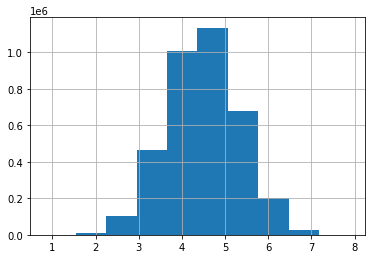

In [ ]:
anal10["answers_table"]["cost"].hist()

In [ ]:
(anal10["answers_table"]["cost"] <= 1.5819744).value_counts()

False    3628375
True         425
Name: cost, dtype: int64

In [ ]:
425 / factorials[10]

0.00011711860670194003

In [ ]:
(anal10["answers_table"]["cost"] <= 2.3232114).value_counts()

False    3614870
True       13930
Name: cost, dtype: int64

In [ ]:
# Если бы мы просто проверяли рандомные перестановки, то лучшее решение было бы из топ-
factorials[10] / (3 * 22 * 28)

1963.6363636363637